In [1]:
# This code managed to produce the desired gif file, but the behavior of FuncAnimation and %matplotlib notebook
# tend to be somehow unintuitive/unpredictable
# I'd really appreciate comments on better way to draw them.

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D



# I use a package 'ffmpeg'
# https://anaconda.org/menpo/ffmpeg
from matplotlib import animation, rc # 'rc' is used for one way to display animation

from IPython.display import HTML, Image # 'HTML' is another way to display animation, 'Image' is to show a saved gif file.


%matplotlib notebook
n = 40

<IPython.core.display.Javascript object>


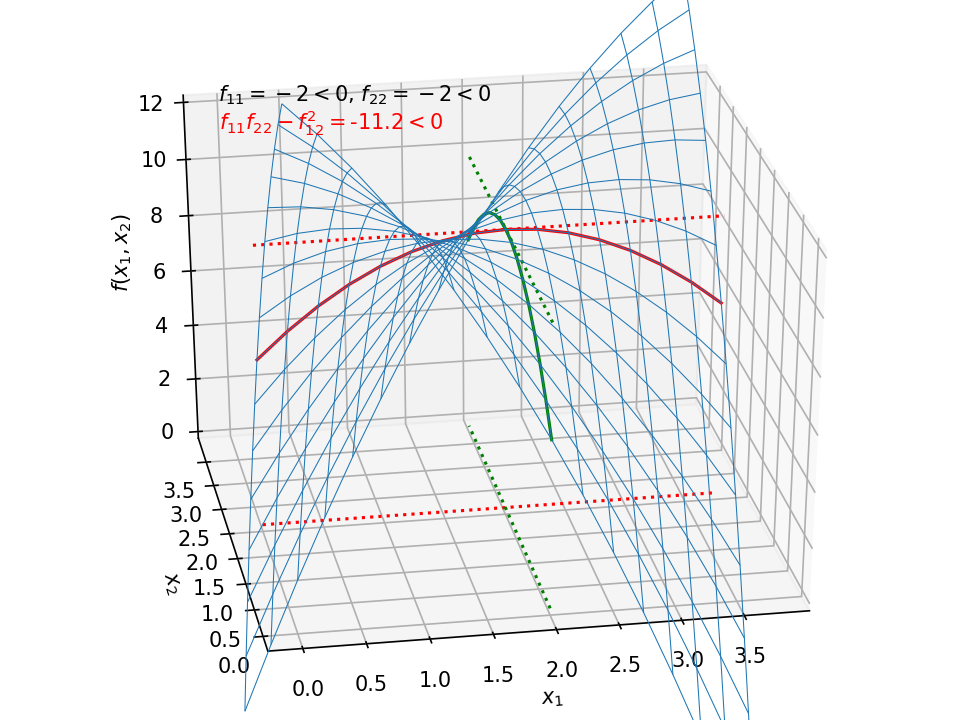

In [2]:
%matplotlib notebook
#Make sure that the figure is in the interactive mode. 

def fun(x, y, al):
    return  - (x-2)**2 - (y -2)**2 + 0.1*al*(x-2)*(y-2) + 10

def sod(x, y, al):
    return  4-(0.1*al)**2

fig = plt.figure();
ax = Axes3D(fig);
l1 = 0
u1 = 4
x1 = np.arange(l1, u1, 0.25)
x2 = np.arange(l1, u1, 0.25)
X1, X2 = np.meshgrid(x1, x2)


#name = 'What if $f_{11}<0, f_{22}<0$, but $f_{11}f_{22} - 2f_{12} <0 $?'
#plt.title(name)
def update(curr):
    ax.cla()
    #plt.cla()
    # Otherwise, new graphs will be written over the old ones
    
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')
    ax.zaxis.set_rotate_label(False) 
    ax.set_zlabel('$f(x_1, x_2)$', rotation = 90)
    ax.view_init(30, 260)
    
    V = fun(X1, X2, curr)
    ax.plot_wireframe(X1, X2, V,  rstride = 1, cstride = 1, linewidth = 0.5)
    sod_n = sod(2, 2, curr)
    sod_s = str(sod_n)[:5]
    if sod_n > 0:
        ax.text(0,4,12, r'$f_{11}=-2<0$, $f_{22}=-2<0$')
        ax.text(0,4,11, '$f_{11}f_{22}-f_{12}^2=$'+sod_s + r'$\geq 0$')
    else: 
        ax.text(0,4,12, r'$f_{11}=-2<0$, $f_{22}=-2<0$')
        ax.text(0,4,11, r'$f_{11}f_{22}-f_{12}^2=$'+sod_s +r'$<0$', color = 'red')
    #plt.annotate
    y = 2*np.ones(len(x1))
    plt.plot(x1, y, ':',  c = 'red')
    plt.plot(x1, y, 10*np.ones(len(x1)), ':',  c = 'red')
    plt.plot(x1, y, fun(x1, y, curr), '-',  c = 'red')
    plt.plot(y, x1,':',  c = 'green')
    plt.plot(y, x1,10*np.ones(len(x1)), ':',  c = 'green')
    plt.plot(y, x1, fun(y, x1, curr), '-',  c = 'green')
    ax.set_zlim(0,12)
    
    #print()
    #return(ax)
update(40)

In [3]:
#fig = plt.figure();
#ax = Axes3D(fig);
a = animation.FuncAnimation(fig, update,
                            #init_func = update(1), 
                            frames = 40,interval =100
                            #, blit = True
                           )
#
a

In [4]:
# I don't know why, but it works only after I run an animation using %matplotlib notebook
#rc('animation', html = 'html5')
#a

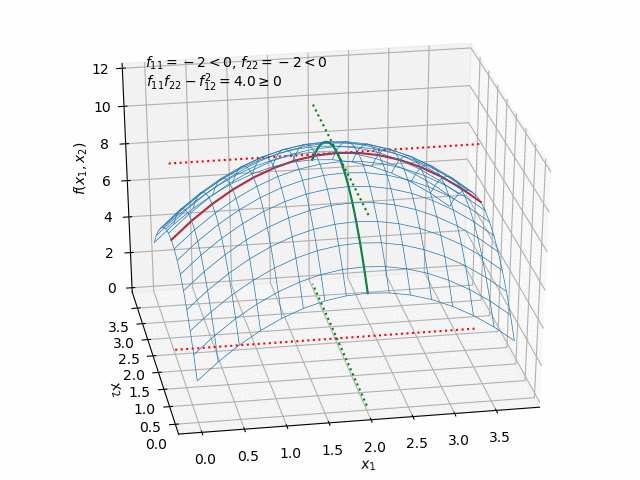

In [5]:
a.save('SOC_Animation.gif', writer='imagemagick')
#plt.show()
Image('SOC_Animation.gif')

<IPython.core.display.Javascript object>


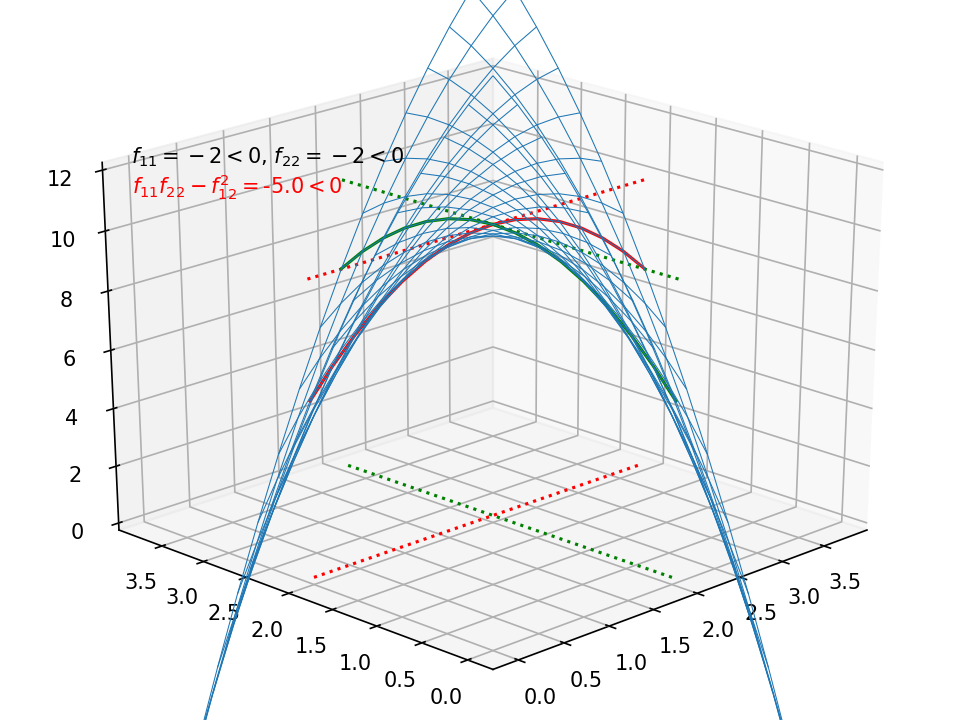

In [6]:
fig = plt.figure();
ax = Axes3D(fig);
l1 = 0
u1 = 4
x1 = np.arange(l1, u1, 0.25)
x2 = np.arange(l1, u1, 0.25)
X1, X2 = np.meshgrid(x1, x2)
V = fun(X1, X2, 40)
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
ax.zaxis.set_rotate_label(False) 
ax.set_zlabel('$f(x_1, x_2)$', rotation = 90)


#name = 'What if $f_{11}<0, f_{22}<0$, but $f_{11}f_{22} - 2f_{12} <0 $?'
#plt.title(name)
def update2(curr):
    
    plt.cla()
    # Otherwise, new graphs will be written over the old ones
          
    ax.plot_wireframe(X1, X2, V,  rstride = 1, cstride = 1, linewidth = 0.5)
    sod_n = sod(2, 2, 30)
    sod_s = str(sod_n)[:5]
    if sod_n > 0:
        ax.text(0,4,12, r'$f_{11}=-2<0$, $f_{22}=-2<0$')
        ax.text(0,4,11, '$f_{11}f_{22}-f_{12}^2=$'+sod_s + r'$\geq 0$')
    else: 
        ax.text(0,4,12, r'$f_{11}=-2<0$, $f_{22}=-2<0$')
        ax.text(0,4,11, r'$f_{11}f_{22}-f_{12}^2=$'+sod_s +r'$<0$', color = 'red')
    #plt.annotate
    y = 2*np.ones(len(x1))
    plt.plot(x1, y, ':',  c = 'red')
    plt.plot(x1, y, 10*np.ones(len(x1)), ':',  c = 'red')
    plt.plot(x1, y, fun(x1, y, 30), '-',  c = 'red')
    plt.plot(y, x1,':',  c = 'green')
    plt.plot(y, x1,10*np.ones(len(x1)), ':',  c = 'green')
    plt.plot(y, x1, fun(y, x1, 30), '-',  c = 'green')
    ax.set_zlim(0,12)
    ax.view_init(25, 180+curr)
    
    #print()
    #return(ax)
#update2(1)

In [7]:
a2 = animation.FuncAnimation(fig, update2,
                            #init_func = update(1), 
                            frames = 90,interval =100
                            #, blit = True
                           )

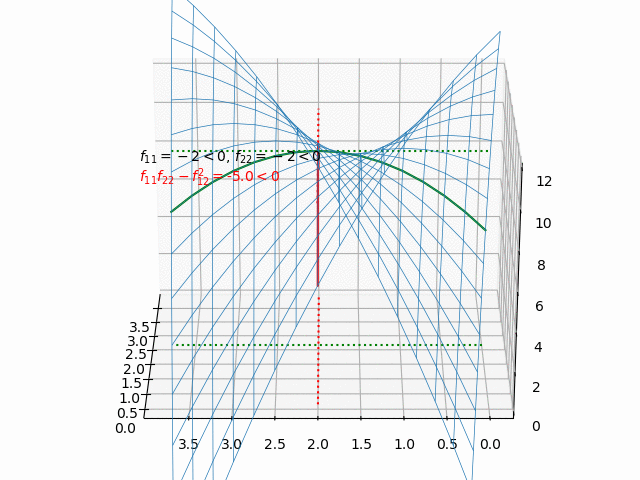

In [8]:
#rc('animation', html = 'html5')
a2.save('SOC_Animation2.gif', writer='imagemagick')
#plt.show()
Image('SOC_Animation2.gif', width = 500)